In [1]:
%matplotlib inline
from matplotlib import pyplot as plt

In [2]:
import datajoint as dj
import numpy as np
import cv2
import imutils


In [3]:
schema = dj.schema('trasfer')

Please enter DataJoint username: root
Please enter DataJoint password: ········
Connecting root@localhost:3306


In [106]:
Source.drop()

/home/ubuntu/datajoint-python/datajoint/connection.py:304: UserWarning: MySQL server has gone away. Reconnecting to the server.
  warnings.warn("MySQL server has gone away. Reconnecting to the server.")


`trasfer`.`#source` (8 tuples)
`trasfer`.`_image` (8 tuples)
`trasfer`.`__transfer` (32 tuples)
`trasfer`.`__crop` (8 tuples)
Proceed? [yes, No]: yes
Tables dropped.  Restart kernel.


In [107]:
@schema
class Source(dj.Lookup):
    definition = """
    name : char(12)
    ---
    image_url : varchar(255)
    """
    
    contents = (
        ('astros', 'https://upload.wikimedia.org/wikipedia/commons/thumb/f/f3/Nolan_Ryan_in_Atlanta_close-up.jpg/220px-Nolan_Ryan_in_Atlanta_close-up.jpg'),
        ('texans', 'https://upload.wikimedia.org/wikipedia/commons/thumb/4/40/J.J._Watt_2018%E2%80%942.JPG/220px-J.J._Watt_2018%E2%80%942.JPG'),
        ('rockets', 'https://upload.wikimedia.org/wikipedia/commons/7/70/Jawann_Oldham_1986-87.jpg'),
        ('bayern', 'https://upload.wikimedia.org/wikipedia/commons/thumb/5/55/CSKA-Bavaria_%284%29.jpg/160px-CSKA-Bavaria_%284%29.jpg'),
        ('cougars', 'https://upload.wikimedia.org/wikipedia/commons/thumb/7/77/Fertitta_Center_Interior_-_December_2018.jpg/120px-Fertitta_Center_Interior_-_December_2018.jpg'),
        ('odin', 'https://upload.wikimedia.org/wikipedia/commons/thumb/c/c8/Wodan_Frea_Himmelsfenster_by_Emil_Doepler.jpg/220px-Wodan_Frea_Himmelsfenster_by_Emil_Doepler.jpg'),
        ('car', 'https://i.pinimg.com/originals/95/ee/3b/95ee3b2477a83e41474ec226e06f839e.jpg'),
        ('lion', 'https://upload.wikimedia.org/wikipedia/commons/thumb/4/49/Male_Lion_on_Rock.jpg/220px-Male_Lion_on_Rock.jpg'),
        ('family','https://scontent-dfw5-2.xx.fbcdn.net/v/t1.18169-0/p206x206/21731313_10212623540455259_5207815343414800537_n.jpg?_nc_cat=104&ccb=1-3&_nc_sid=da31f3&_nc_ohc=uHH1IhWl6GAAX8rsQXN&_nc_ht=scontent-dfw5-2.xx&tp=6&oh=2fb4414e0a4628741d700c05177199a1&oe=60B43B28')
    )

In [7]:
Image.drop()

NameError: name 'Image' is not defined

In [109]:
import requests
import os

@schema
class Image(dj.Imported):
    definition = """
    -> Source
    ---
    image : longblob
    """
    
    def make(self, key):
        url = (Source & key).fetch1('image_url')
        tempfile = 'image.tmp'
        with open(tempfile, 'wb') as f:
            f.write(requests.get(url).content)
        self.insert1(dict(key, image=plt.imread(tempfile)))
        os.unlink(tempfile)

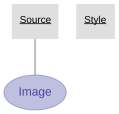

In [110]:
dj.Diagram(schema)

In [111]:
Image.populate(display_progress=True)

Image: 100%|██████████| 9/9 [00:01<00:00,  6.31it/s]


In [112]:
Image() * Source

name,image,image_url
astros,=BLOB=,https://upload.wikimedia.org/wikipedia/commons/thumb/f/f3/Nolan_Ryan_in_Atlanta_close-up.jpg/220px-Nolan_Ryan_in_Atlanta_close-up.jpg
bayern,=BLOB=,https://upload.wikimedia.org/wikipedia/commons/thumb/5/55/CSKA-Bavaria_%284%29.jpg/160px-CSKA-Bavaria_%284%29.jpg
car,=BLOB=,https://i.pinimg.com/originals/95/ee/3b/95ee3b2477a83e41474ec226e06f839e.jpg
cougars,=BLOB=,https://upload.wikimedia.org/wikipedia/commons/thumb/7/77/Fertitta_Center_Interior_-_December_2018.jpg/120px-Fertitta_Center_Interior_-_December_2018.jpg
family,=BLOB=,https://scontent-dfw5-2.xx.fbcdn.net/v/t1.18169-0/p206x206/21731313_10212623540455259_5207815343414800537_n.jpg?_nc_cat=104&ccb=1-3&_nc_sid=da31f3&_nc_ohc=uHH1IhWl6GAAX8rsQXN&_nc_ht=scontent-dfw5-2.xx&tp=6&oh=2fb4414e0a4628741d700c05177199a1&oe=60B43B28
lion,=BLOB=,https://upload.wikimedia.org/wikipedia/commons/thumb/4/49/Male_Lion_on_Rock.jpg/220px-Male_Lion_on_Rock.jpg
odin,=BLOB=,https://upload.wikimedia.org/wikipedia/commons/thumb/c/c8/Wodan_Frea_Himmelsfenster_by_Emil_Doepler.jpg/220px-Wodan_Frea_Himmelsfenster_by_Emil_Doepler.jpg
rockets,=BLOB=,https://upload.wikimedia.org/wikipedia/commons/7/70/Jawann_Oldham_1986-87.jpg
texans,=BLOB=,https://upload.wikimedia.org/wikipedia/commons/thumb/4/40/J.J._Watt_2018%E2%80%942.JPG/220px-J.J._Watt_2018%E2%80%942.JPG


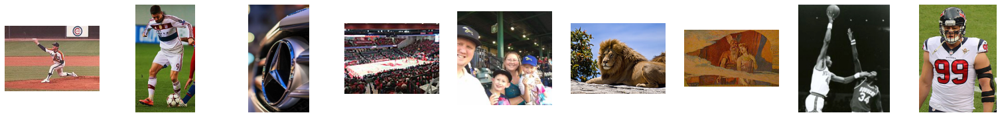

In [113]:
fig, ax = plt.subplots(1, len(Image()), figsize=(len(Image())*3,3))
for a, img in zip(ax, Image.fetch('image')):
    a.imshow(img)
    a.axis(False)

In [114]:
@schema
class Crop(dj.Computed):
    definition = """
    -> Image
    ---
    cropped_image : longblob
    """
    
    def make(self, key):
        img = (Image & key).fetch1('image')
        sz = min((img.shape[:2]))
        sz1 = (img.shape[0] - sz)//2
        sz2 = (img.shape[1] - sz)//2
        img = imutils.resize(img[sz1:sz1+sz, sz2:sz2+sz], width=600, height=600)
        self.insert1(dict(key, cropped_image=img))

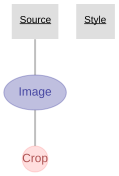

In [115]:
dj.Diagram(schema)

In [116]:
Crop.populate(display_progress=True)

Crop: 100%|██████████| 9/9 [00:01<00:00,  7.58it/s]


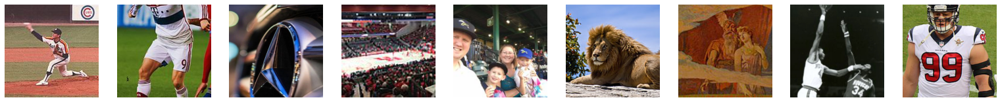

In [117]:
fig, ax = plt.subplots(1, len(Crop()), figsize=(len(Crop())*3,3))
for a, img in zip(ax, Crop.fetch('cropped_image')):
    a.imshow(img)
    a.axis(False)

In [118]:
Style.drop()

`trasfer`.`#style` (4 tuples)
Proceed? [yes, No]: no


In [18]:
@schema
class Style(dj.Lookup):
    definition = """
    style_name      : varchar(30)
    """
    contents = (['udnie'], ['la_muse'], ['starry_night'], ['mosaic'])

In [19]:
ls models

la_muse.t7  mosaic.t7  starry_night.t7  udnie.t7


In [119]:
image = Crop.fetch('cropped_image', limit = 1)[0]

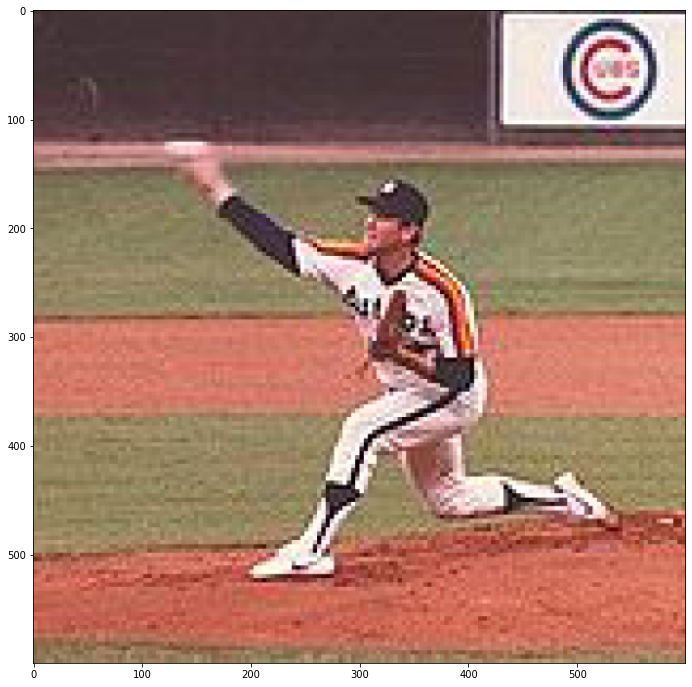

In [120]:
plt.imshow(image)

In [121]:
    net = cv2.dnn.readNetFromTorch('/home/ubuntu/StyleTransfer/notebooks/models/la_muse.t7')    
    image = imutils.resize(image, width=600)
    (h, w) = image.shape[:2]

    # construct a blob from the image, set the input, and then perform a
    # forward pass of the network
    blob = cv2.dnn.blobFromImage(image, 1.0, (w, h),
                                 (103.939, 116.779, 123.680), swapRB=False, crop=False)
    net.setInput(blob)
    output = net.forward()

    # reshape the output tensor, add back in the mean subtraction, and
    # then swap the channel ordering
    output = output.reshape((3, output.shape[2], output.shape[3]))
    output[0] += 103.939
    output[1] += 116.779
    output[2] += 123.680
    output = output.transpose(1, 2, 0)
    output = np.clip(output, 0, 255)
    output= output.astype('uint8')

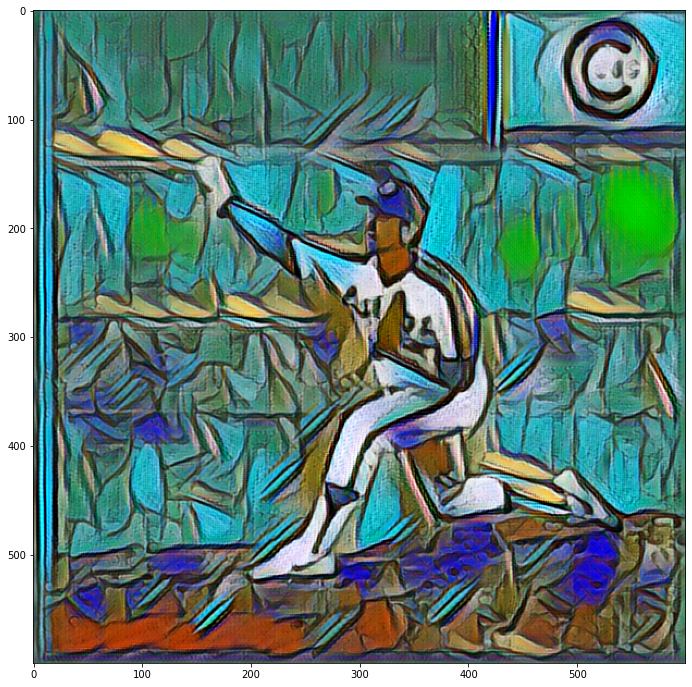

In [122]:
plt.imshow(output)


In [123]:
@schema
class Transfer(dj.Computed):
    definition = """
    -> Image
    -> Style
    ---
    art_image : longblob
    """
    
    def make(self, key):
        image = (Image & key).fetch1('image')
        style_name = (Style & key).fetch1('style_name')
        net = cv2.dnn.readNetFromTorch(f'/home/ubuntu/StyleTransfer/notebooks/models/{style_name}.t7')
        image = imutils.resize(image, width=800)
        (h, w) = image.shape[:2]

        # construct a blob from the image, set the input, and then perform a
        # forward pass of the network
        blob = cv2.dnn.blobFromImage(image, 1.0, (w, h),
                                     (103.939, 116.779, 123.680), swapRB=False, crop=False)
        net.setInput(blob)
        output = net.forward()

        # reshape the output tensor, add back in the mean subtraction, and
        # then swap the channel ordering
        output = output.reshape((3, output.shape[2], output.shape[3]))
        output[0] += 103.939
        output[1] += 116.779
        output[2] += 123.680
        output = output.transpose(1, 2, 0)
        output = np.clip(output, 0, 255)
        output= output.astype('uint8')
        self.insert1(dict(key, art_image=output))
        

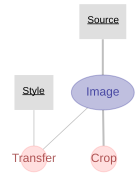

In [124]:
dj.Diagram(schema)

In [125]:
Transfer.populate()

In [126]:
Transfer()

name,style_name,art_image
astros,la_muse,=BLOB=
bayern,la_muse,=BLOB=
car,la_muse,=BLOB=
cougars,la_muse,=BLOB=
family,la_muse,=BLOB=
lion,la_muse,=BLOB=
odin,la_muse,=BLOB=
rockets,la_muse,=BLOB=
texans,la_muse,=BLOB=
astros,mosaic,=BLOB=


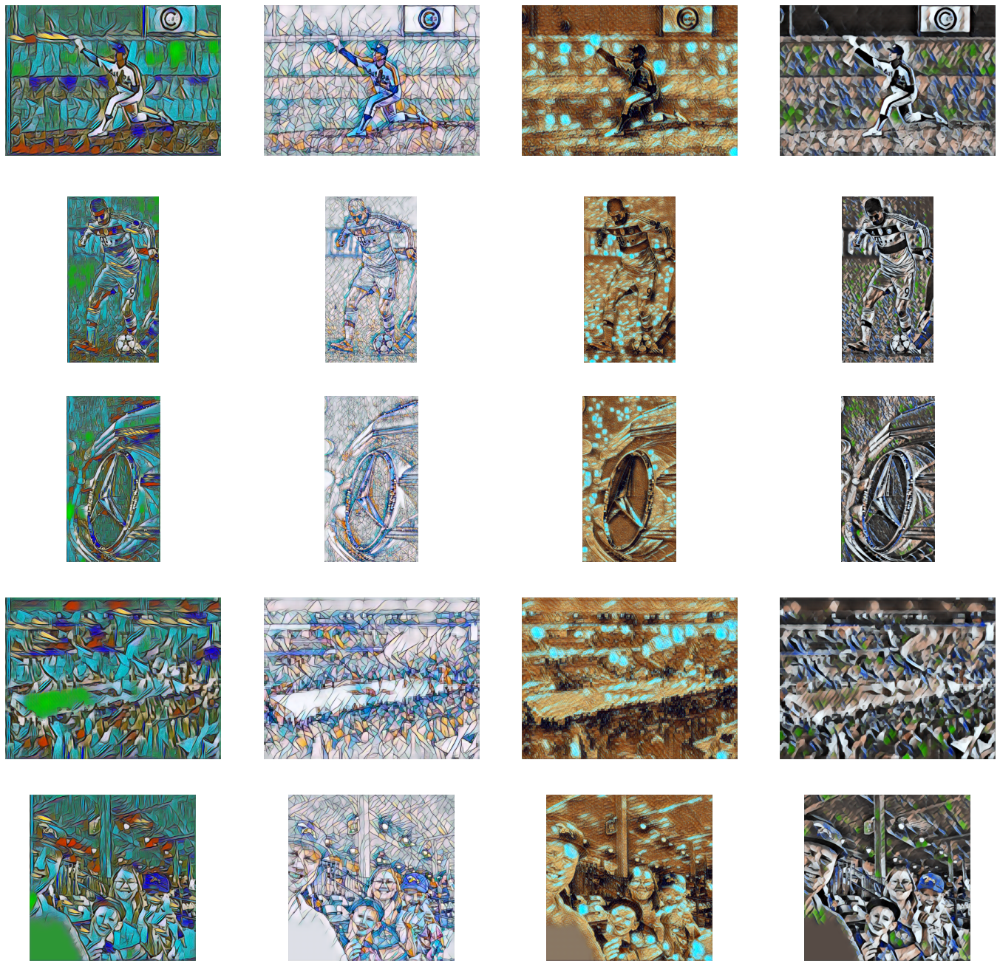

In [127]:
fig, axx = plt.subplots(5, 4, figsize=(24, 24))

for ax, img in zip(axx.flatten(), Transfer.fetch('art_image')):
    ax.imshow(img)
    ax.axis(False)

In [29]:
import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [30]:
import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

In [31]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [57]:
content_path = tf.keras.utils.get_file('NolanRyan.jpg', 'https://upload.wikimedia.org/wikipedia/commons/thumb/f/f3/Nolan_Ryan_in_Atlanta_close-up.jpg/220px-Nolan_Ryan_in_Atlanta_close-up.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

In [58]:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [59]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

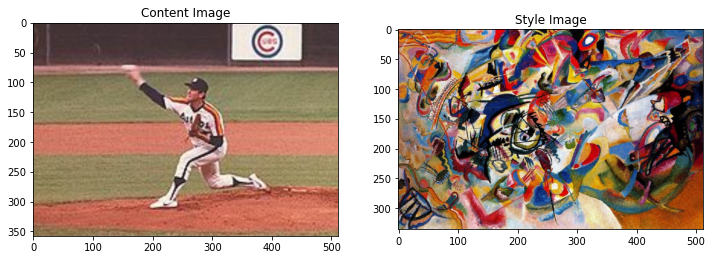

In [60]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

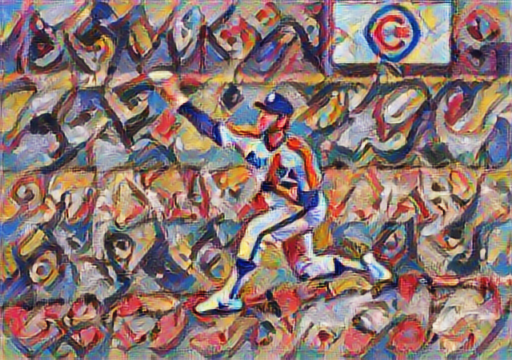

In [61]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [50]:
content_path = tf.keras.utils.get_file('watt.jpg', 'https://upload.wikimedia.org/wikipedia/commons/thumb/4/40/J.J._Watt_2018%E2%80%942.JPG/220px-J.J._Watt_2018%E2%80%942.JPG')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

In [51]:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [52]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

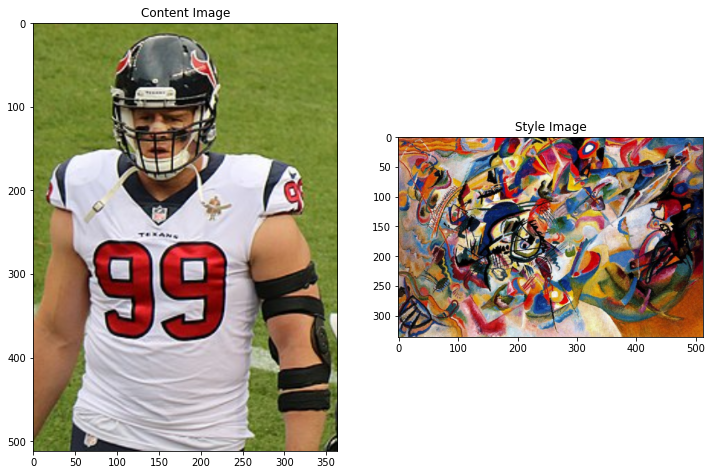

In [53]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

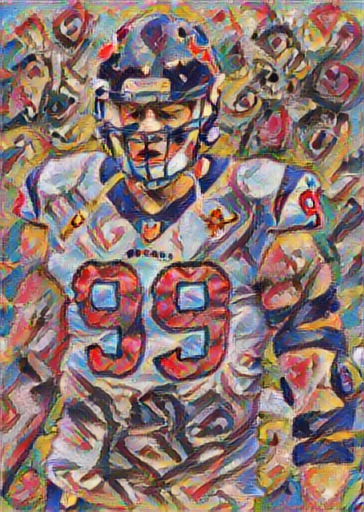

In [56]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [62]:
content_path = tf.keras.utils.get_file('lewandowski.jpg', 'https://upload.wikimedia.org/wikipedia/commons/thumb/5/55/CSKA-Bavaria_%284%29.jpg/160px-CSKA-Bavaria_%284%29.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

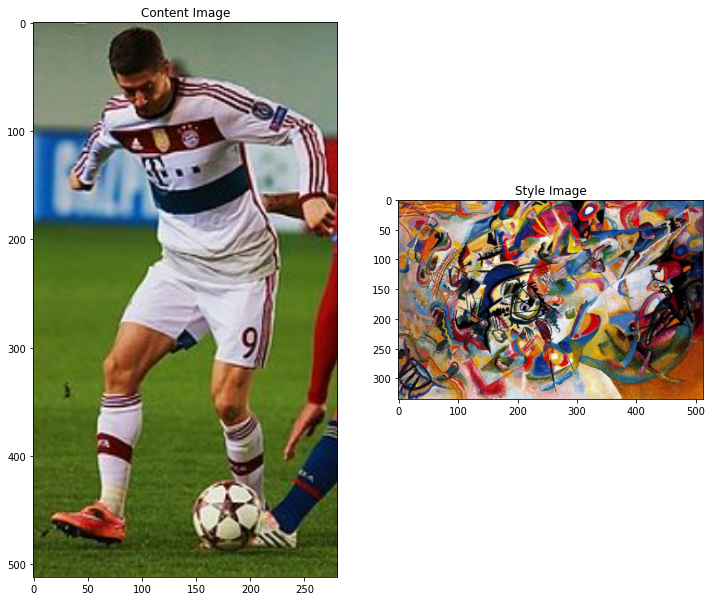

In [63]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

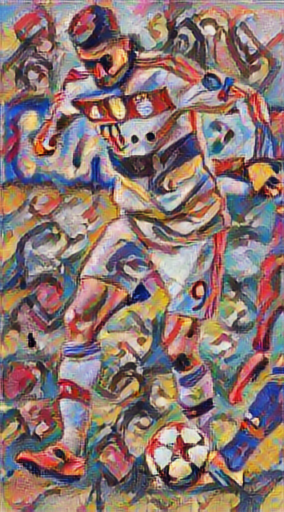

In [64]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [65]:
content_path = tf.keras.utils.get_file('mercedes.jpg', 'https://i.pinimg.com/originals/95/ee/3b/95ee3b2477a83e41474ec226e06f839e.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

131072/129258 [==============================] - 0s 0us/step


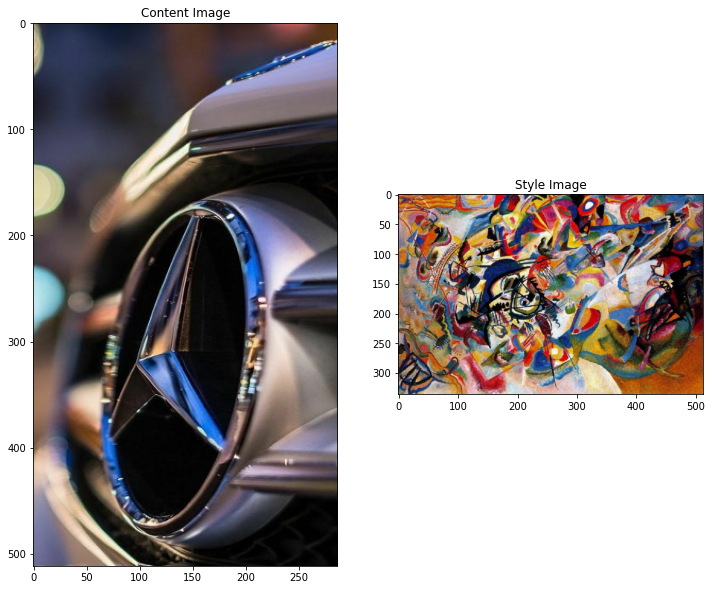

In [67]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

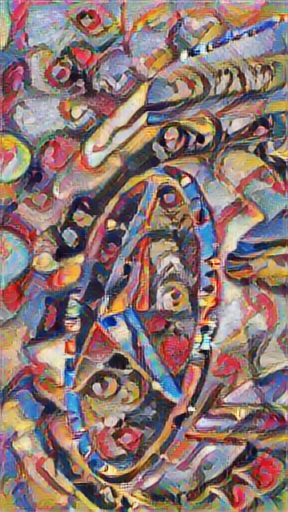

In [68]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [96]:
content_path = tf.keras.utils.get_file('coogs.jpg', 'https://upload.wikimedia.org/wikipedia/commons/thumb/7/77/Fertitta_Center_Interior_-_December_2018.jpg/120px-Fertitta_Center_Interior_-_December_2018.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

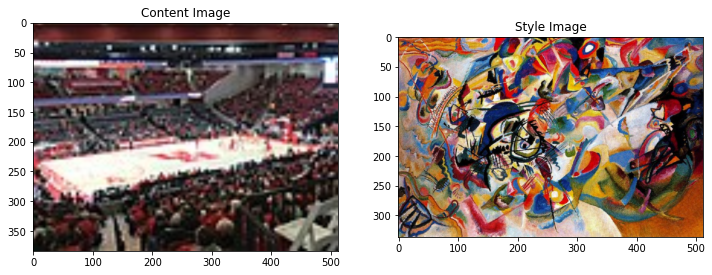

In [97]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

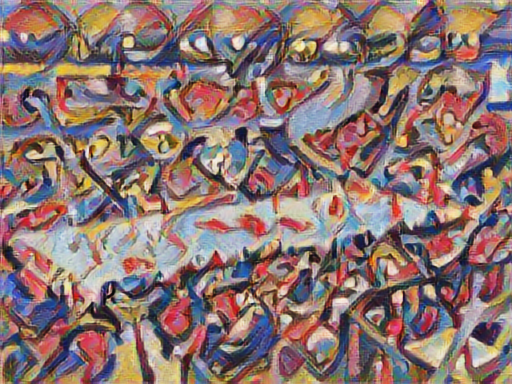

In [98]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [95]:
content_path = tf.keras.utils.get_file('lion.jpg', 'https://upload.wikimedia.org/wikipedia/commons/thumb/4/49/Male_Lion_on_Rock.jpg/220px-Male_Lion_on_Rock.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

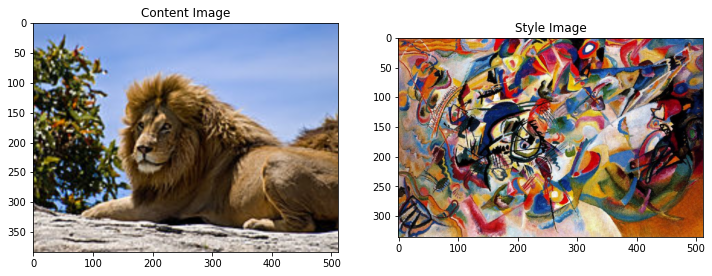

In [81]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

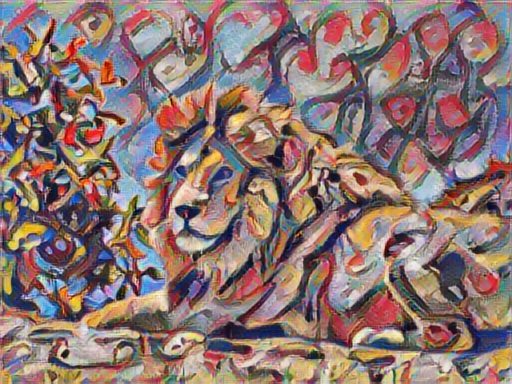

In [82]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [83]:
content_path = tf.keras.utils.get_file('odin.jpg', 'https://upload.wikimedia.org/wikipedia/commons/thumb/c/c8/Wodan_Frea_Himmelsfenster_by_Emil_Doepler.jpg/220px-Wodan_Frea_Himmelsfenster_by_Emil_Doepler.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

16384/10341 [===============================================] - 0s 0us/step


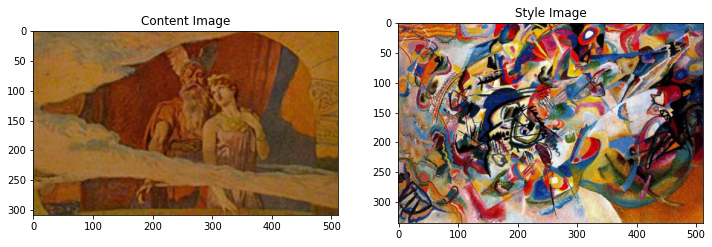

In [84]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

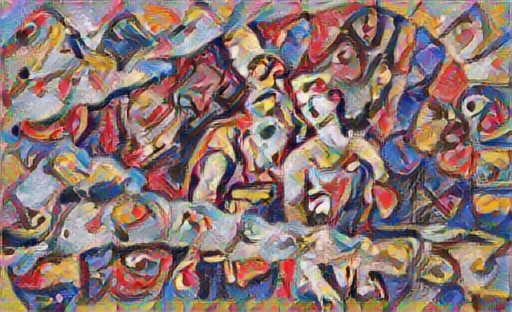

In [85]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [86]:
content_path = tf.keras.utils.get_file('hakeem.jpg', 'https://upload.wikimedia.org/wikipedia/commons/7/70/Jawann_Oldham_1986-87.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

32768/28397 [==================================] - 0s 0us/step


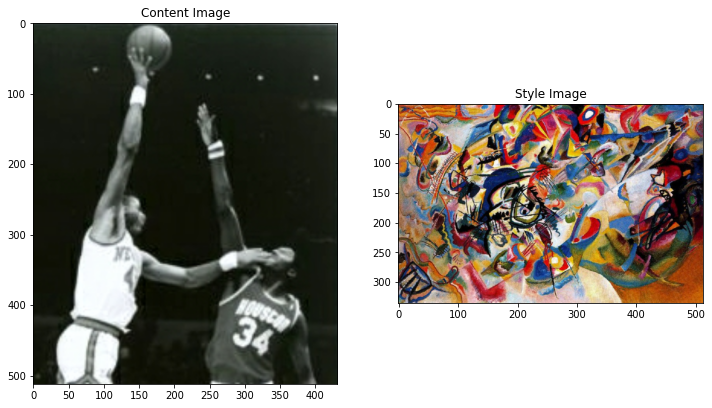

In [87]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

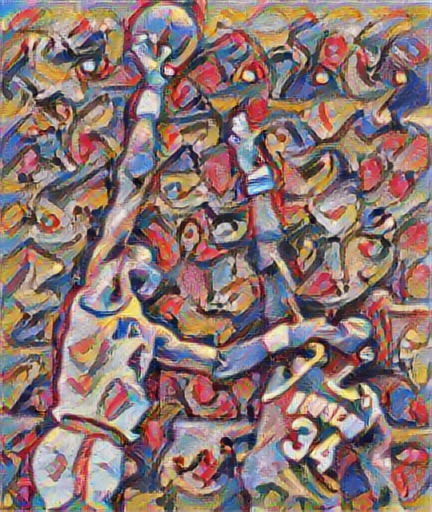

In [88]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [102]:
content_path = tf.keras.utils.get_file('family.jpg', 'https://scontent-dfw5-2.xx.fbcdn.net/v/t1.18169-0/p206x206/21731313_10212623540455259_5207815343414800537_n.jpg?_nc_cat=104&ccb=1-3&_nc_sid=da31f3&_nc_ohc=uHH1IhWl6GAAX8rsQXN&_nc_ht=scontent-dfw5-2.xx&tp=6&oh=2fb4414e0a4628741d700c05177199a1&oe=60B43B28')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

16384/11483 [==========================================] - 0s 0us/step


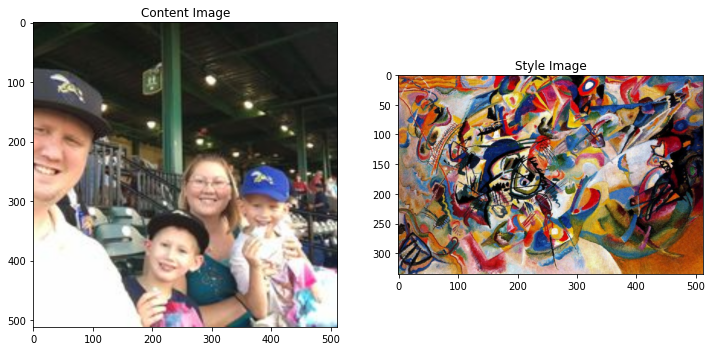

In [103]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

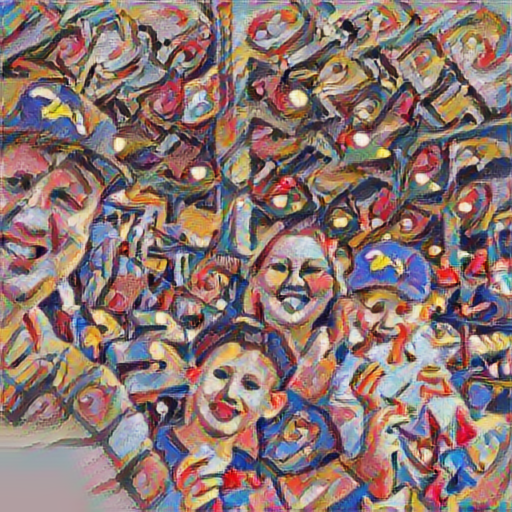

In [104]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)